In [151]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

import itertools
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from PIL import Image
from sklearn.metrics import classification_report, f1_score , confusion_matrix
# Tensorflow Libraries
import tensorflow as tf
from tensorflow import keras
from keras.layers import Dense, Dropout , BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers,models,Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Mengubah import preprocessing
# from tensorflow.keras.layers import preprocessing
from tensorflow.keras import preprocessing # Import langsung dari tensorflow.keras
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

In [152]:
# from google.colab import drive
# drive.mount('/content/drive')
# dataset = {
#     "train_data": "/content/drive/My Drive/sports-classification/train",
#     "valid_data": "/content/drive/My Drive/sports-classification/valid",
#     "test_data": "/content/drive/My Drive/sports-classification/test"
# }


In [153]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("gpiosenka/sports-classification")

print("Path to dataset files:", path)

In [154]:
dataset = {
    "train_data": "/root/.cache/kagglehub/datasets/gpiosenka/sports-classification/versions/9/train",
    "valid_data": "/root/.cache/kagglehub/datasets/gpiosenka/sports-classification/versions/9/valid",
    "test_data": "/root/.cache/kagglehub/datasets/gpiosenka/sports-classification/versions/9/test"
}

In [155]:
def get_labels_and_counts(dataset):
    result = {}
    for key, path in dataset.items():
        counts = {}
        if os.path.isdir(path):  # Memastikan path adalah direktori
            # Iterasi semua folder di dalam path
            for label in os.listdir(path):
                label_path = os.path.join(path, label)
                if os.path.isdir(label_path):  # Hanya hitung jika folder
                    # Hanya menghitung file yang memiliki ekstensi valid (contoh: .jpg, .png)
                    valid_files = [
                        f for f in os.listdir(label_path)
                        if os.path.isfile(os.path.join(label_path, f))
                    ]
                    counts[label] = len(valid_files)
        result[key] = counts
    return result

# Mendapatkan label dan jumlahnya untuk semua label di dataset
label_counts = get_labels_and_counts(dataset)


In [156]:
all_data = []

for path in dataset.values():
    data = {"imgpath": [], "labels": []}
    # Ambil semua folder tanpa filter
    categories = [
        label for label in os.listdir(path)
        if os.path.isdir(os.path.join(path, label))
    ]

    for folder in categories:
        folder_path = os.path.join(path, folder)
        # Ambil semua file valid (contoh: hanya file dengan ekstensi gambar)
        filelist = [
            f for f in os.listdir(folder_path)
            if os.path.isfile(os.path.join(folder_path, f))
        ]
        for file in filelist:
            fpath = os.path.join(folder_path, file)
            data["imgpath"].append(fpath)
            data["labels"].append(folder)

    all_data.append(data.copy())

# Membuat DataFrame untuk masing-masing data
train_df = pd.DataFrame(all_data[0], index=range(len(all_data[0]['imgpath'])))
valid_df = pd.DataFrame(all_data[1], index=range(len(all_data[1]['imgpath'])))
test_df = pd.DataFrame(all_data[2], index=range(len(all_data[2]['imgpath'])))

# Encode labels menjadi angka
lb = LabelEncoder()
train_df['encoded_labels'] = lb.fit_transform(train_df['labels'])
valid_df['encoded_labels'] = lb.transform(valid_df['labels'])  # Gunakan transform
test_df['encoded_labels'] = lb.transform(test_df['labels'])   # Gunakan transform

# Menampilkan contoh data
print(train_df.head())
print(valid_df.head())
print(test_df.head())

                                             imgpath   labels  encoded_labels
0  /kaggle/input/sports-classification/train/bobs...  bobsled              13
1  /kaggle/input/sports-classification/train/bobs...  bobsled              13
2  /kaggle/input/sports-classification/train/bobs...  bobsled              13
3  /kaggle/input/sports-classification/train/bobs...  bobsled              13
4  /kaggle/input/sports-classification/train/bobs...  bobsled              13
                                             imgpath   labels  encoded_labels
0  /kaggle/input/sports-classification/valid/bobs...  bobsled              13
1  /kaggle/input/sports-classification/valid/bobs...  bobsled              13
2  /kaggle/input/sports-classification/valid/bobs...  bobsled              13
3  /kaggle/input/sports-classification/valid/bobs...  bobsled              13
4  /kaggle/input/sports-classification/valid/bobs...  bobsled              13
                                             imgpath   labels  e

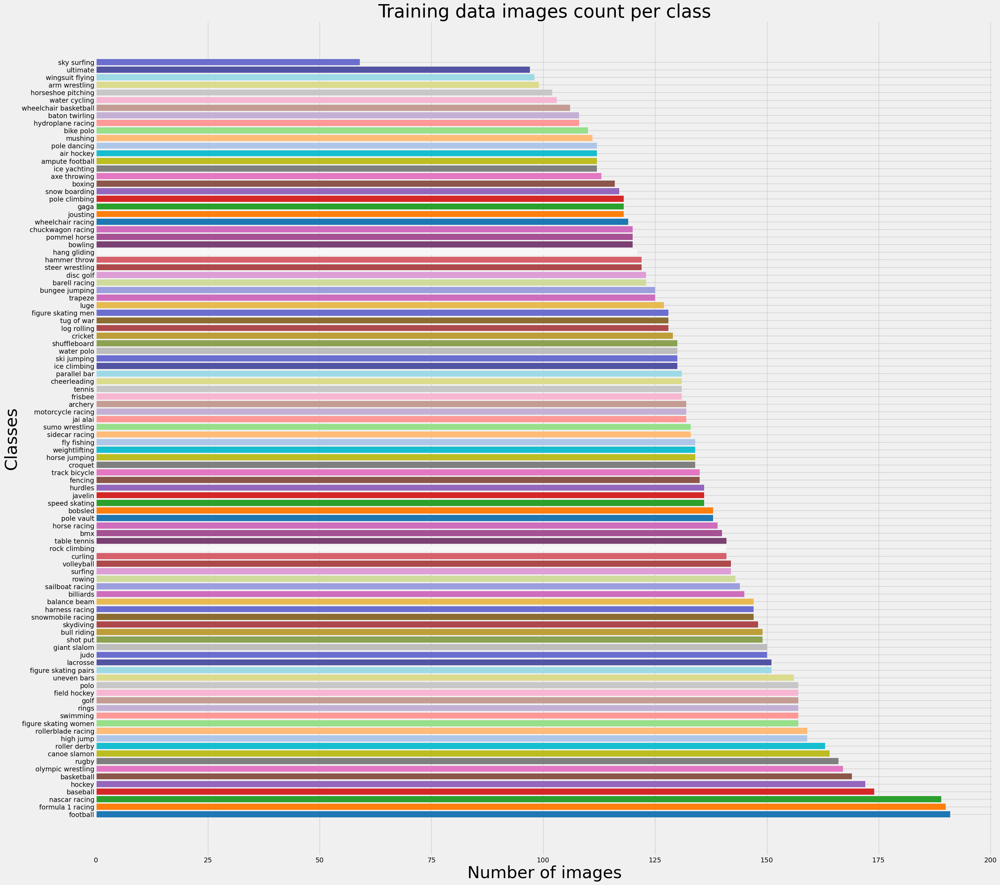

In [157]:
train  = train_df["labels"].value_counts()
label = train.tolist()
index = train.index.tolist()

colors = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
    "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
    "#aec7e8", "#ffbb78", "#98df8a", "#ff9896", "#c5b0d5",
    "#c49c94", "#f7b6d2", "#c7c7c7", "#dbdb8d", "#9edae5",
    "#5254a3", "#6b6ecf", "#bdbdbd", "#8ca252", "#bd9e39",
    "#ad494a", "#8c6d31", "#6b6ecf", "#e7ba52", "#ce6dbd",
    "#9c9ede", "#cedb9c", "#de9ed6", "#ad494a", "#d6616b",
    "#f7f7f7", "#7b4173", "#a55194", "#ce6dbd"
]

plt.figure(figsize=(30,30))
plt.title("Training data images count per class",fontsize=38)
plt.xlabel('Number of images', fontsize=35)
plt.ylabel('Classes', fontsize=35)
plt.barh(index,label, color=colors)
plt.grid(True)
plt.show()

In [158]:
# def load_all_data(dataset):
#     all_data = []
#     for path in dataset.values():
#         data = {"imgpath": [], "labels": []}
#         # Ambil semua subfolder (label) dalam direktori path
#         categories = [label for label in os.listdir(path) if os.path.isdir(os.path.join(path, label))]

#         for folder in categories:
#             folder_path = os.path.join(path, folder)
#             file_list = os.listdir(folder_path)
#             for file in file_list:
#                 file_path = os.path.join(folder_path, file)
#                 if os.path.isfile(file_path):  # Pastikan hanya memproses file
#                     data["imgpath"].append(file_path)
#                     data["labels"].append(folder)

#         all_data.append(pd.DataFrame(data))  # Simpan data sebagai DataFrame untuk tiap subset (train, valid, test)

#     return all_data

# # Memuat data
# dataframes = load_all_data(dataset)
# train_df, valid_df, test_df = dataframes  # Asumsikan dataset memiliki key untuk train, valid, dan test

# # Encoding label
# lb = LabelEncoder()
# train_df['encoded_labels'] = lb.fit_transform(train_df['labels'])
# valid_df['encoded_labels'] = lb.transform(valid_df['labels'])
# test_df['encoded_labels'] = lb.transform(test_df['labels'])

# # Tampilkan hasil
# print("Train DataFrame:")
# print(train_df.head())
# print("\nValid DataFrame:")
# print(valid_df.head())
# print("\nTest DataFrame:")
# print(test_df.head())

In [159]:
train_df.sample(n=5, random_state=1)

,imgpath,labels,encoded_labels
3449,/kaggle/input/sports-classification/train/ice ...,ice climbing,47
5802,/kaggle/input/sports-classification/train/jave...,javelin,50
2979,/kaggle/input/sports-classification/train/fris...,frisbee,33
1034,/kaggle/input/sports-classification/train/voll...,volleyball,93
479,/kaggle/input/sports-classification/train/fly ...,fly fishing,30


In [160]:
print("----------Train-------------")
print(train_df[["imgpath", "labels"]].head(5))
print(train_df.shape)
print("--------Validation----------")
print(valid_df[["imgpath", "labels"]].head(5))
print(valid_df.shape)
print("----------Test--------------")
print(test_df[["imgpath", "labels"]].head(5))
print(test_df.shape)

----------Train-------------
                                             imgpath   labels
0  /kaggle/input/sports-classification/train/bobs...  bobsled
1  /kaggle/input/sports-classification/train/bobs...  bobsled
2  /kaggle/input/sports-classification/train/bobs...  bobsled
3  /kaggle/input/sports-classification/train/bobs...  bobsled
4  /kaggle/input/sports-classification/train/bobs...  bobsled
(13493, 3)
--------Validation----------
                                             imgpath   labels
0  /kaggle/input/sports-classification/valid/bobs...  bobsled
1  /kaggle/input/sports-classification/valid/bobs...  bobsled
2  /kaggle/input/sports-classification/valid/bobs...  bobsled
3  /kaggle/input/sports-classification/valid/bobs...  bobsled
4  /kaggle/input/sports-classification/valid/bobs...  bobsled
(500, 3)
----------Test--------------
                                             imgpath   labels
0  /kaggle/input/sports-classification/test/bobsl...  bobsled
1  /kaggle/input/sports-c

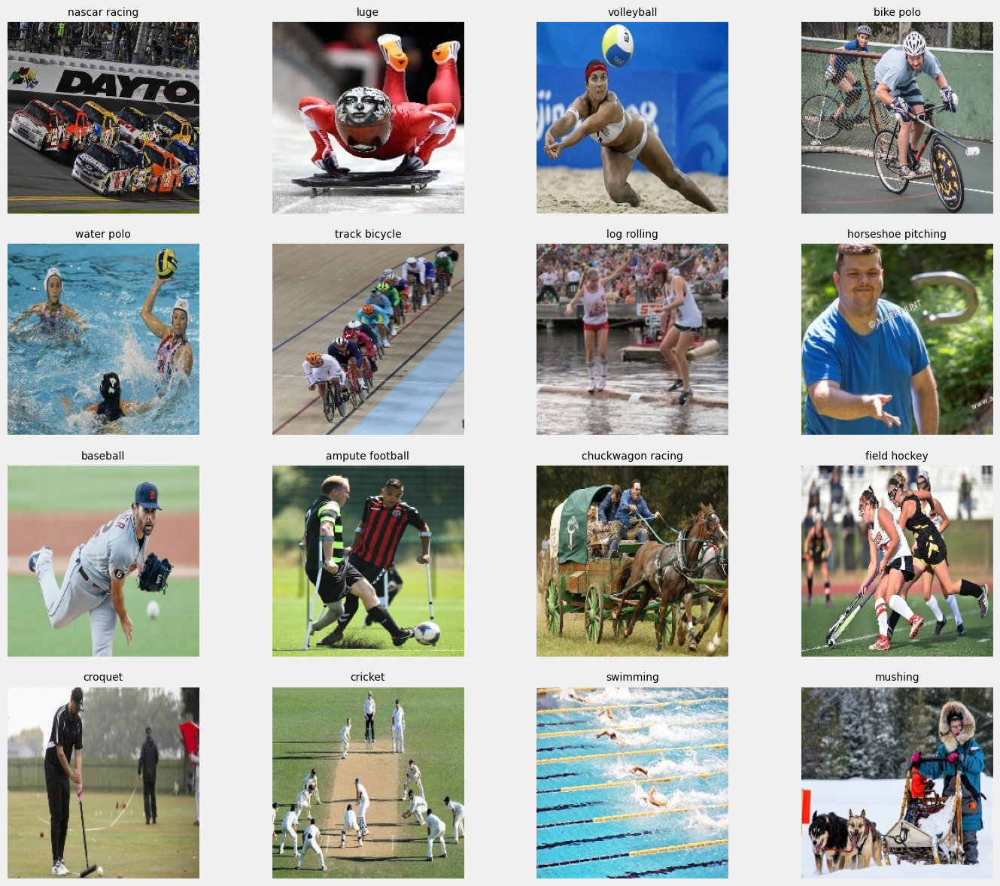

In [161]:
sample_count = min(16, len(valid_df))  # Maksimal 16 atau sebanyak data tersedia

# Visualisasi 16 gambar acak dari valid_df
plt.figure(figsize=(15, 12))
for i, row in valid_df.sample(n=sample_count).reset_index().iterrows():
    plt.subplot(4, 4, i + 1)
    image_path = row['imgpath']
    try:
        image = Image.open(image_path)
        plt.imshow(image)
        plt.title(row["labels"], fontsize=10)
        plt.axis('off')
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")

plt.tight_layout()
plt.show()

#Creating Dataloaders

Found 13492 validated image filenames belonging to 100 classes.
Found 500 validated image filenames belonging to 100 classes.
Found 500 validated image filenames belonging to 100 classes.
Shape batch_x: (8, 224, 224, 3), Shape batch_y: (8, 100)
Labels (one-hot): [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

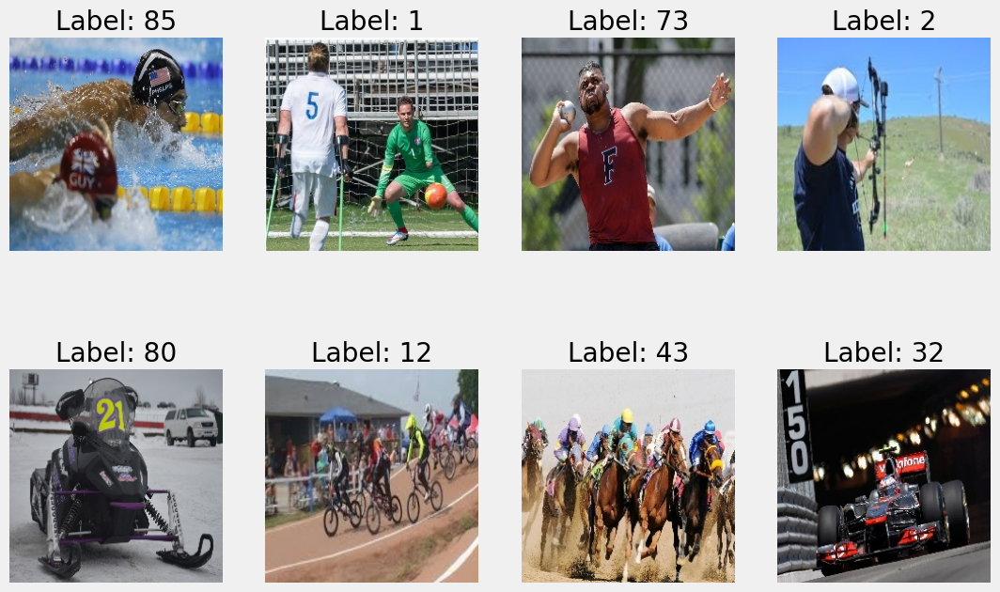

Total validation samples: 500
CPU times: user 958 ms, sys: 238 ms, total: 1.2 s
Wall time: 933 ms


In [162]:
%%time

BATCH_SIZE = 8
IMAGE_SIZE = (224, 224)

# Pastikan tidak ada filter berdasarkan selected_labels
# Gunakan dataframe yang sudah ada
train_df_filtered = train_df
valid_df_filtered = valid_df
test_df_filtered = test_df

# Generator untuk training, validation, dan test
generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    # Anda dapat menambahkan augmentasi gambar di sini jika diinginkan
)

# Training set
train_images = generator.flow_from_dataframe(
    dataframe=train_df_filtered,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
)

# Validation set
val_images = generator.flow_from_dataframe(
    dataframe=valid_df_filtered,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False,
)

# Test set
test_images = generator.flow_from_dataframe(
    dataframe=test_df_filtered,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False,
)


# Periksa konsistensi batch dari data generator
batch_x, batch_y = next(iter(train_images)) # Now train_images is defined
print(f"Shape batch_x: {batch_x.shape}, Shape batch_y: {batch_y.shape}")
print(f"Labels (one-hot): {batch_y[:5]}")  # Menampilkan 5 label pertama

# Visualisasi beberapa gambar dari batch
plt.figure(figsize=(12, 8))
for i in range(min(8, len(batch_x))):  # Menampilkan 8 gambar pertama
    plt.subplot(2, 4, i + 1)
    plt.imshow(batch_x[i].astype("uint8"))
    plt.title(f"Label: {np.argmax(batch_y[i])}")
    plt.axis('off')
plt.show()

print(f"Total validation samples: {val_images.samples}")

#Model Structure

In [163]:
# Load the pretained model
pretrained_model = tf.keras.applications.EfficientNetB0(
    input_shape=(224, 224, 3),
    include_top=False, # we don`t need a pre-trained top layer (output layer)
    weights='imagenet',
    pooling='avg'
)

# Freezing the layers of a pretrained neural network
for i, layer in enumerate(pretrained_model.layers):
    pretrained_model.layers[i].trainable = False

In [ ]:
from tensorflow.keras.layers import RandomTranslation

In [165]:
# Menghitung jumlah kelas
num_classes = len(set(train_images.classes))

# Data Augmentation Step
augment = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),  # Flip gambar secara horizontal
    layers.RandomRotation(0.2), # Rotasi gambar secara acak
    RandomTranslation(height_factor=0.1, width_factor=0.1),
    layers.RandomZoom(0.2),  # Zoom gambar secara acak
    layers.RandomContrast(0.2),  # Kontras gambar secara acak
], name='AugmentationLayer')

# Membuat model
inputs = layers.Input(shape=(224, 224, 3), name='inputLayer')
x = augment(inputs)  # Apply augmentation
pretrain_out = pretrained_model(x, training=False)  # Menggunakan pretrained model tanpa melatih ulang

# Menambahkan lapisan kustom
x = layers.Dense(1024, activation='relu')(pretrain_out)  # Dense layer pertama
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu')(x)
x = BatchNormalization()(x)  # Batch normalization
x = layers.Dropout(0.25)(x)  # Dropout layer untuk menghindari overfitting
x = layers.Dense(num_classes)(x)  # Dense layer output dengan jumlah kelas
outputs = layers.Activation(activation="softmax", dtype=tf.float32, name='activationLayer')(x)  # Softmax untuk klasifikasi multi-kelas

# Menyusun model
model = Model(inputs=inputs, outputs=outputs)

# Mengkompilasi model
model.compile(
    optimizer=Adam(0.0005),
    loss='categorical_crossentropy',  # Categorical Crossentropy untuk klasifikasi multi-kelas
    metrics=['accuracy']  # Mengukur akurasi
)

# Menampilkan ringkasan model
model.summary()

Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputLayer (InputLayer)     [(None, 224, 224, 3)]     0         
                                                                 
 AugmentationLayer (Sequenti  (None, 224, 224, 3)      0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, 1280)             4049571   
                                                                 
 dense_36 (Dense)            (None, 1024)              1311744   
                                                                 
 dropout_24 (Dropout)        (None, 1024)              0         
                                                                 
 dense_37 (Dense)            (None, 512)               524800    
                                                          

# Training : Transfer Learning

In [166]:
# Training the model
history = model.fit(
    train_images,  # Training data
    # steps_per_epoch=len(train_images) // BATCH_SIZE,  # Jumlah langkah per epoch (jumlah batch)
    validation_data=val_images,  # Data validasi
    # validation_steps=len(val_images) // BATCH_SIZE,  # Jumlah langkah validasi
    epochs=15,  # Jumlah epoch
    verbose = 1,
    callbacks=[
        EarlyStopping(
            monitor="val_loss",  # Memantau nilai val_loss
            patience=5,  # Menunggu 5 epoch tanpa perbaikan
            restore_best_weights=True  # Memulihkan bobot terbaik jika pelatihan berhenti lebih awal
        ),
        ReduceLROnPlateau(
            monitor='val_loss',  # Memantau perubahan val_loss
            factor=0.2,  # Faktor pengurangan learning rate (0.2 artinya 20% dari nilai sebelumnya)
            patience=2,  # Menunggu 2 epoch tanpa perbaikan sebelum mengurangi learning rate
            mode='min'  # Mode untuk menentukan arah pengurangan (berdasarkan nilai minimum)
        )
    ]
)

# # Pastikan direktori 'checkpoints' ada
# os.makedirs('./checkpoints', exist_ok=True)

# # Menyimpan bobot model
# model.save_weights('./checkpoints/my_checkpoint.weights.h5')

Epoch 1/15
1687/1687 [==============================] - 52s 25ms/step - loss: 2.4272 - accuracy: 0.3950 - val_loss: 0.7395 - val_accuracy: 0.7880 - lr: 5.0000e-04
Epoch 2/15
1687/1687 [==============================] - 38s 22ms/step - loss: 1.5160 - accuracy: 0.5833 - val_loss: 0.5011 - val_accuracy: 0.8360 - lr: 5.0000e-04
Epoch 3/15
1687/1687 [==============================] - 38s 22ms/step - loss: 1.3160 - accuracy: 0.6354 - val_loss: 0.4783 - val_accuracy: 0.8500 - lr: 5.0000e-04
Epoch 4/15
1687/1687 [==============================] - 38s 22ms/step - loss: 1.2115 - accuracy: 0.6581 - val_loss: 0.3947 - val_accuracy: 0.8720 - lr: 5.0000e-04
Epoch 5/15
1687/1687 [==============================] - 38s 23ms/step - loss: 1.1052 - accuracy: 0.6920 - val_loss: 0.3612 - val_accuracy: 0.8880 - lr: 5.0000e-04
Epoch 6/15
1687/1687 [==============================] - 38s 22ms/step - loss: 1.0081 - accuracy: 0.7081 - val_loss: 0.4380 - val_accuracy: 0.8760 - lr: 5.0000e-04
Epoch 7/15
1687/1687 [

# Display model performance

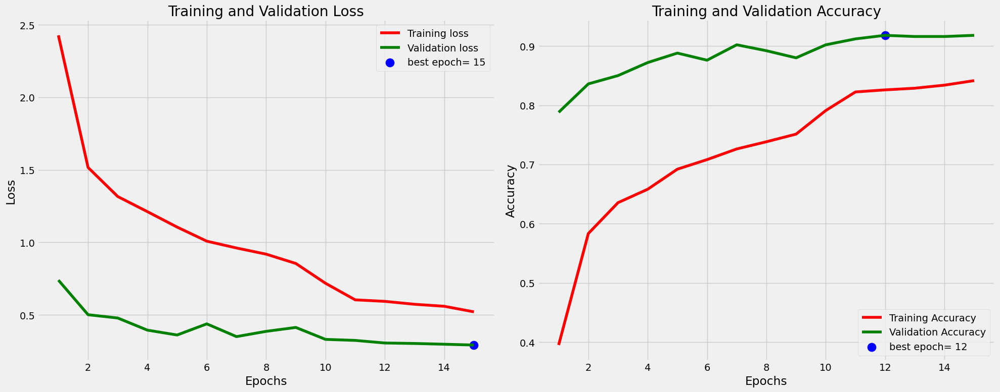

In [167]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

# Adjust the Epochs to match the actual number of epochs run
Epochs = [i+1 for i in range(len(val_loss))]  # Use len(val_loss) since it's shorter

index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize=(20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss[:len(val_loss)], 'r', label='Training loss')  # Match val_loss length
plt.plot(Epochs, val_loss, 'g', label='Validation loss')
plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc[:len(val_acc)], 'r', label='Training Accuracy')  # Match val_acc length
plt.plot(Epochs, val_acc, 'g', label='Validation Accuracy')
plt.scatter(index_acc + 1, acc_highest, s=150, c='blue', label=acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


# Fine Tuning

In [168]:
# Mengatur model pretrained agar dapat dilatih ulang (fine-tuning)
pretrained_model.trainable = True

# Melakukan iterasi pada semua lapisan model pretrained
for layer in pretrained_model.layers:
    # Mengecek apakah lapisan tersebut adalah lapisan BatchNormalization
    if isinstance(layer, layers.BatchNormalization): 
        # Jika iya, lapisan BatchNormalization diatur agar tidak dilatih ulang
        # Hal ini dilakukan karena BatchNormalization memiliki statistik internal
        # yang tidak perlu di-update selama fine-tuning
        layer.trainable = False

# Melihat status 'trainable' dari 20 lapisan pertama pada model pretrained
for l in pretrained_model.layers[:20]:
    # Menampilkan nama lapisan dan status apakah lapisan tersebut dilatih ulang atau tidak
    print(l.name, l.trainable)

# Mengkompilasi model dengan parameter fine-tuning
model.compile(
    optimizer=Adam(0.0001),  # Menggunakan learning rate kecil (0.0001) untuk fine-tuning
                             # agar perubahan bobot model pretrained lebih halus
    loss='categorical_crossentropy',  # Menggunakan loss fungsi untuk klasifikasi multi-kelas
    metrics=['accuracy']  # Menggunakan akurasi sebagai metrik evaluasi model
)

input_10 True
rescaling_18 True
normalization_9 True
rescaling_19 True
stem_conv_pad True
stem_conv True
stem_bn False
stem_activation True
block1a_dwconv True
block1a_bn False
block1a_activation True
block1a_se_squeeze True
block1a_se_reshape True
block1a_se_reduce True
block1a_se_expand True
block1a_se_excite True
block1a_project_conv True
block1a_project_bn False
block2a_expand_conv True
block2a_expand_bn False


In [169]:
history = model.fit(
    train_images,
    # steps_per_epoch=len(train_images) // BATCH_SIZE,
    validation_data=val_images,
    # validation_steps=len(val_images) // BATCH_SIZE,
    epochs=25,
    callbacks=[
        EarlyStopping(monitor = "val_loss",
                               patience = 4,
                               restore_best_weights = True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min') 
    ]
)
model.save_weights('./checkpoints/my_checkpoint')

Epoch 1/25
1687/1687 [==============================] - 140s 72ms/step - loss: 0.6010 - accuracy: 0.8222 - val_loss: 0.4491 - val_accuracy: 0.8840 - lr: 1.0000e-04
Epoch 2/25
1687/1687 [==============================] - 114s 67ms/step - loss: 0.4499 - accuracy: 0.8679 - val_loss: 0.3221 - val_accuracy: 0.9040 - lr: 1.0000e-04
Epoch 3/25
1687/1687 [==============================] - 115s 68ms/step - loss: 0.3358 - accuracy: 0.8993 - val_loss: 0.4115 - val_accuracy: 0.8860 - lr: 1.0000e-04
Epoch 4/25
1687/1687 [==============================] - 114s 68ms/step - loss: 0.3075 - accuracy: 0.9049 - val_loss: 0.3390 - val_accuracy: 0.9120 - lr: 1.0000e-04
Epoch 5/25
1687/1687 [==============================] - 114s 67ms/step - loss: 0.1591 - accuracy: 0.9514 - val_loss: 0.2618 - val_accuracy: 0.9460 - lr: 2.0000e-05
Epoch 6/25
1687/1687 [==============================] - 115s 68ms/step - loss: 0.1212 - accuracy: 0.9644 - val_loss: 0.2468 - val_accuracy: 0.9360 - lr: 2.0000e-05
Epoch 7/25
1687/

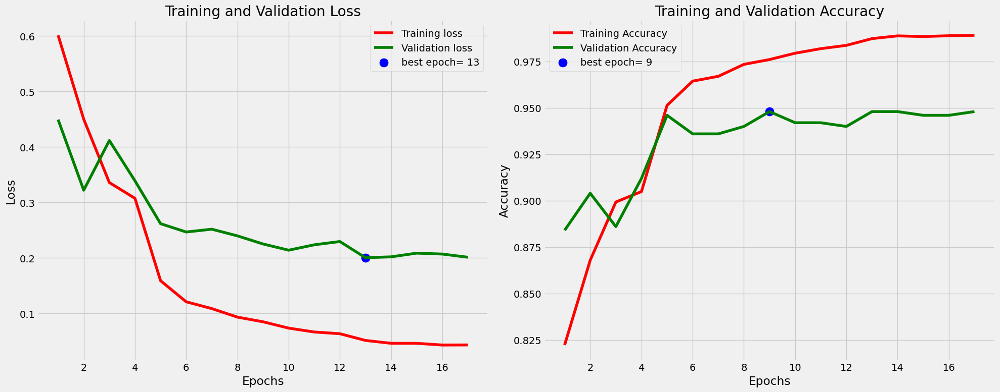

In [170]:
# Define needed variables
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

# Adjust the Epochs to match the actual number of epochs run
Epochs = [i+1 for i in range(len(val_loss))]  # Use len(val_loss) since it's shorter

index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize=(20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss[:len(val_loss)], 'r', label='Training loss')  # Match val_loss length
plt.plot(Epochs, val_loss, 'g', label='Validation loss')
plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc[:len(val_acc)], 'r', label='Training Accuracy')  # Match val_acc length
plt.plot(Epochs, val_acc, 'g', label='Validation Accuracy')
plt.scatter(index_acc + 1, acc_highest, s=150, c='blue', label=acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [171]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.11387
Test Accuracy: 95.80%


# confusion matrix

In [172]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

63/63 [==============================] - 3s 20ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,13,bobsled,13,bobsled,/kaggle/input/sports-classification/test/bobsl...,1.000000
1,1,13,bobsled,13,bobsled,/kaggle/input/sports-classification/test/bobsl...,0.999915
2,2,13,bobsled,13,bobsled,/kaggle/input/sports-classification/test/bobsl...,0.997632
3,3,13,bobsled,13,bobsled,/kaggle/input/sports-classification/test/bobsl...,0.821093
4,4,13,bobsled,13,bobsled,/kaggle/input/sports-classification/test/bobsl...,1.000000
5,5,45,hurdles,45,hurdles,/kaggle/input/sports-classification/test/hurdl...,1.000000
6,6,45,hurdles,45,hurdles,/kaggle/input/sports-classification/test/hurdl...,0.999556
7,7,45,hurdles,45,hurdles,/kaggle/input/sports-classification/test/hurdl...,0.989666


In [173]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

63/63 [==============================] - 1s 17ms/step
F1 Score: 0.9573434343434343
                       precision    recall  f1-score   support

           air hockey       1.00      1.00      1.00         5
      ampute football       1.00      1.00      1.00         5
              archery       1.00      1.00      1.00         5
        arm wrestling       1.00      1.00      1.00         5
         axe throwing       0.83      1.00      0.91         5
         balance beam       1.00      1.00      1.00         5
        barell racing       1.00      1.00      1.00         5
             baseball       1.00      0.80      0.89         5
           basketball       0.83      1.00      0.91         5
       baton twirling       1.00      1.00      1.00         5
            bike polo       0.83      1.00      0.91         5
            billiards       1.00      1.00      1.00         5
                  bmx       1.00      0.80      0.89         5
              bobsled       0.83  

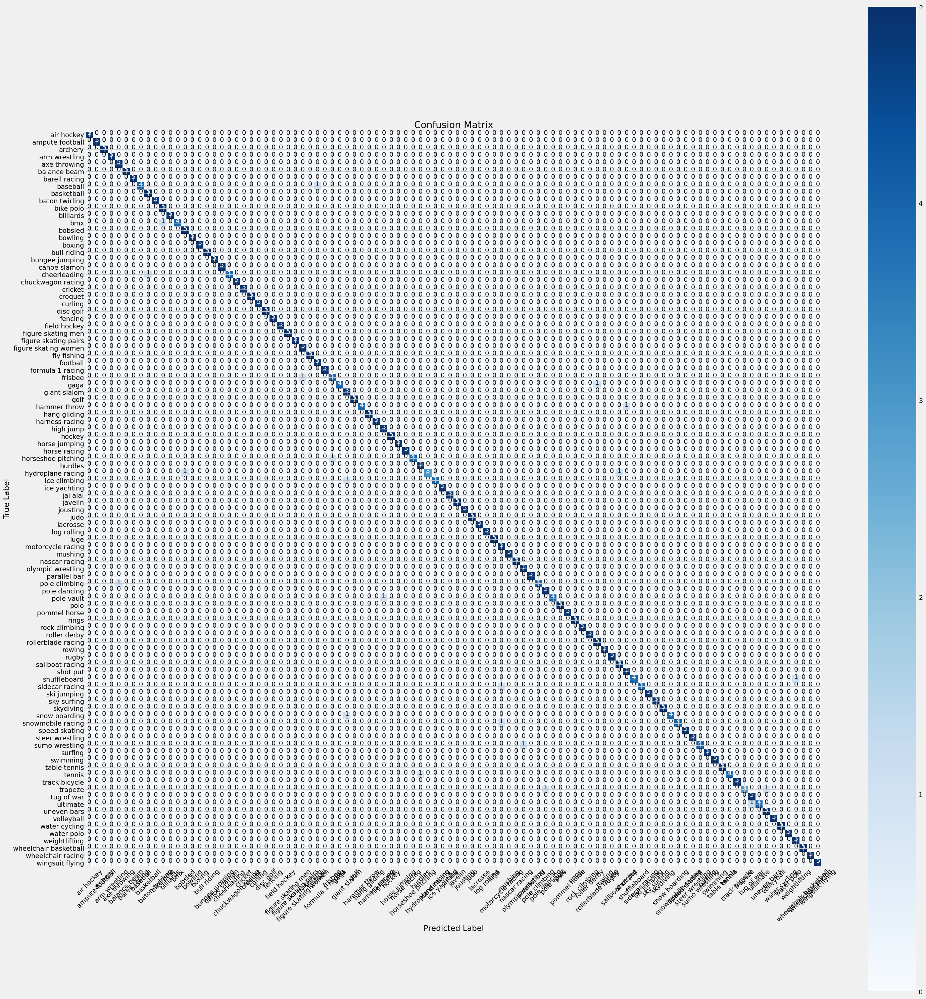

In [ ]:
preds = model.predict(test_images)
y_pred = np.argmax(preds, axis=1)
g_dict = test_images.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize= (30, 30))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)


thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

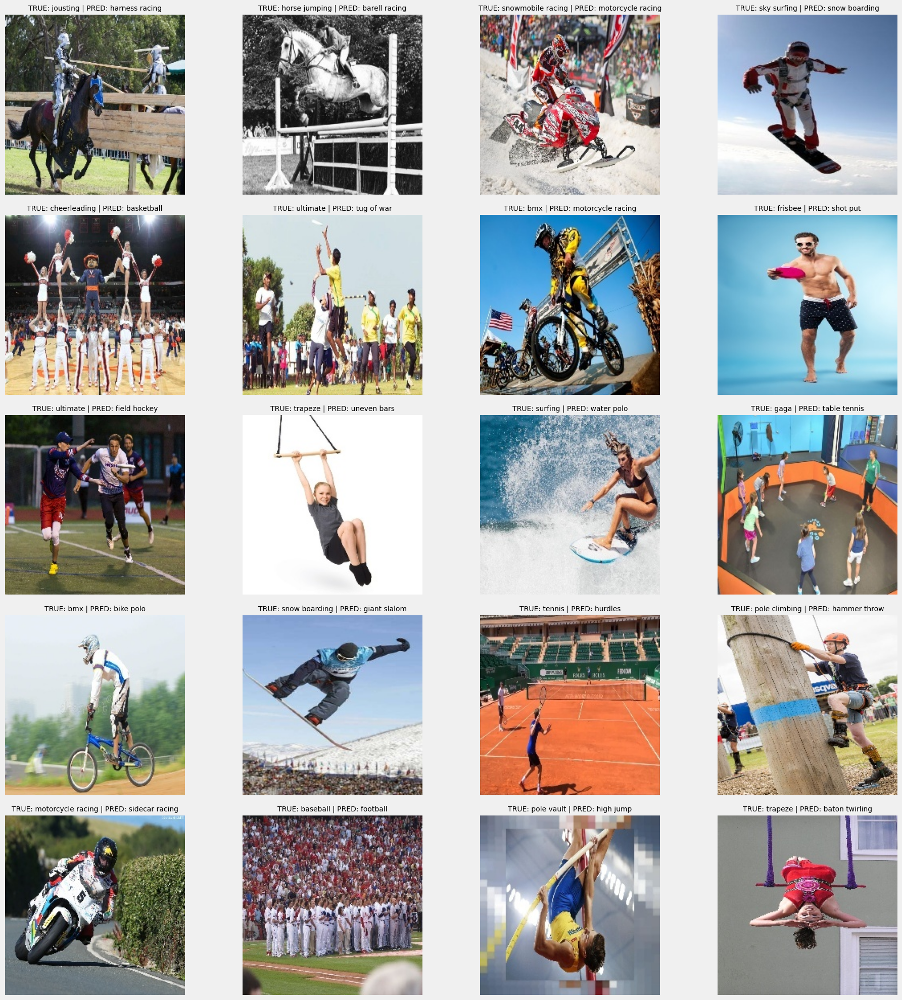

In [175]:
# Mis-match cases where Test Labels do not match Prediction Labels
mismatches = Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability", ascending=False).tail(20)

plt.figure(figsize=(20, 20))

for i, row in mismatches.reset_index().iterrows():
    plt.subplot(5, 4, i + 1)
    try:
        image_path = row['Path']
        image = Image.open(image_path)
        plt.imshow(image)
        plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=10)
        plt.axis('off')
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        plt.imshow(np.zeros((224, 224, 3)))  # Shows an empty image if the actual image fails to load
        plt.title("Image Load Failed", fontsize=10)
        plt.axis('off')

plt.tight_layout()
plt.show()

In [176]:
for i in range(5):  # Cek beberapa batch dari generator
    batch = train_images.next()
    print(f"Batch {i+1}: {len(batch[0])} images, {len(batch[1])} labels")

Batch 1: 8 images, 8 labels
Batch 2: 8 images, 8 labels
Batch 3: 8 images, 8 labels
Batch 4: 8 images, 8 labels
Batch 5: 8 images, 8 labels
